In [29]:
import os

os.environ['TF_XLA_FLAGS'] = '--tf_xla_enable_xla_devices'
from GravNN.Visualization.MapVisualization import MapVisualization
from GravNN.Visualization.VisualizationBase import VisualizationBase

from GravNN.GravityModels.SphericalHarmonics import SphericalHarmonics, get_sh_data
from GravNN.Networks import utils
from GravNN.Support.Grid import Grid
from GravNN.Support.transformations import sphere2cart, cart2sph, invert_projection, project_acceleration
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
import copy
import pickle
import sys
import time

import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.io
import tensorflow as tf
import tensorflow_model_optimization as tfmot
from GravNN.CelestialBodies.Planets import Earth
from GravNN.GravityModels.SphericalHarmonics import SphericalHarmonics, get_sh_data
from GravNN.Networks import utils
from GravNN.Networks.Plotting import Plotting
from GravNN.Networks.Callbacks import CustomCallback
from GravNN.Networks.Compression import (cluster_model, prune_model,
                                         quantize_model)
from GravNN.Networks.Model import CustomModel, load_config_and_model
from GravNN.Networks.Networks import (DenseNet, InceptionNet, ResNet,
                                      TraditionalNet)
from GravNN.Networks.Plotting import Plotting
from GravNN.Trajectories.DHGridDist import DHGridDist
from GravNN.Trajectories.RandomDist import RandomDist
from GravNN.Trajectories.ReducedGridDist import ReducedGridDist
from GravNN.Trajectories.ReducedRandDist import ReducedRandDist
from GravNN.Support.Grid import Grid
from GravNN.Support.transformations import cart2sph, sphere2cart, project_acceleration
from GravNN.Visualization.MapVisualization import MapVisualization
from GravNN.Visualization.VisualizationBase import VisualizationBase
from sklearn.preprocessing import MinMaxScaler, StandardScaler



In [2]:

def plot_intermediate_layer(config, model, columns):
    planet = Earth()
    density_deg = 180
    traj = DHGridDist(planet, planet.radius, degree=density_deg)

    x_transformer = config['x_transformer'][0]
    a_transformer = config['a_transformer'][0]

    x = x_transformer.transform(traj.positions)

    mapUnit = 'mGal'
    map_vis = MapVisualization(mapUnit)
    plt.rc('text', usetex=False)
    for layer_i in range(0, 10):
        map_vis.newFig()
        i = 0
        new_model = tf.keras.Model(model.network.inputs, model.network.layers[layer_i].output)
        basis_functions = new_model(x)
        output = np.zeros(np.shape(x))
        rows, cols = int(np.ceil(np.shape(basis_functions)[1]/columns)), columns
        if layer_i == 0 or layer_i == 9:
            rows = 3
            cols = 1
        plt.subplot(rows, cols, 1)
        for basis_function in np.transpose(basis_functions):
            plt.subplot(rows, cols, 1+int(i))

            output[:,0] = basis_function

            grid_pred = Grid(trajectory=traj, accelerations=output)

            im = map_vis.new_map(grid_pred.total)
            plt.xlabel(None)
            plt.ylabel(None)
            plt.xticks([])
            plt.yticks([])
            i += 1
        plt.suptitle("Layer:" + str(layer_i))

    map_vis.newFig()
    grid_pred = Grid(trajectory=traj, accelerations=model.network(x))
    im = map_vis.new_map(grid_pred.total)
    plt.title("Final Acceleration")

In [35]:
def load_config_and_model(model_id, df_file):
    # Get the parameters and stats for a given run
    # If the dataframe hasn't been loaded
    if type(df_file) == str:
        config = utils.get_df_row(model_id, df_file)
    else:
        # If the dataframe has already been loaded
        config = df_file[model_id == df_file['id']].to_dict()
        for key, value in config.items():
            config[key] = list(value.values())

    # Reinitialize the model
    network = tf.keras.models.load_model('C:\\Users\\John\\Documents\\Research\\ML_Gravity' + "/Data/Networks/"+str(model_id)+"/network")
    model = CustomModel(config, network)
    if 'adam' in config['optimizer'][0]:
        optimizer = tf.keras.optimizers.Adam()
    elif 'rms' in config['optimizer'][0]:
        optimizer = tf.keras.optimizers.RMSprop()
    else:
        exit("No Optimizer Found")
    model.compile(optimizer=optimizer, loss='mse') #! Check that this compile is even necessary

    return config, model

In [37]:
df_file = 'C:\\Users\\John\\Documents\\Research\\ML_Gravity\\Data\\Dataframes\\hyperparameter_v3.data'

#df = pd.read_pickle(df_file)#[3:]#.sort_values(by='params')[2:]##[:2]
df = pd.read_pickle(df_file).sort_values(by='Brillouin_rse_mean')

# Best Performer

In [45]:
df = df.sort_values(by='Brillouin_rse_mean', ascending=True)
df.iloc[0]

Brillouin_max_error                                                        0.00602751
Brillouin_param_rse_mean                                                          103
Brillouin_param_rse_median                                                         98
Brillouin_param_sigma_2_c_mean                                                    100
Brillouin_param_sigma_2_c_median                                                   98
Brillouin_param_sigma_2_mean                                                      111
Brillouin_param_sigma_2_median                                                    116
Brillouin_param_sigma_3_c_mean                                                    100
Brillouin_param_sigma_3_c_median                                                   98
Brillouin_param_sigma_3_mean                                                      112
Brillouin_param_sigma_3_median                                                    114
Brillouin_rse_mean                                    

c:\users\john\documents\research\venv\tf2env\lib\site-packages\ipykernel_launcher.py:26: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


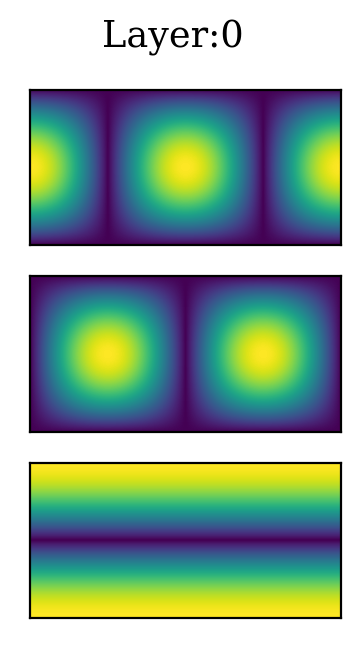

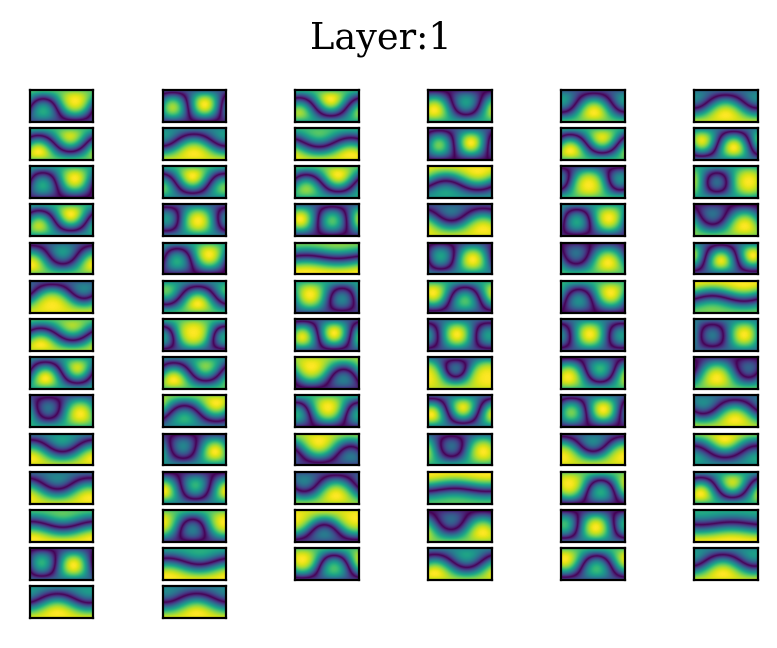

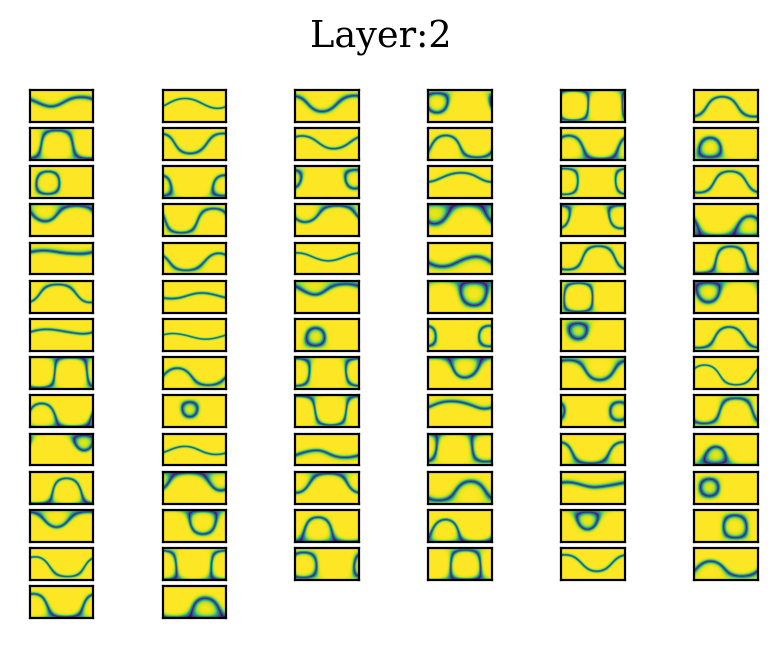

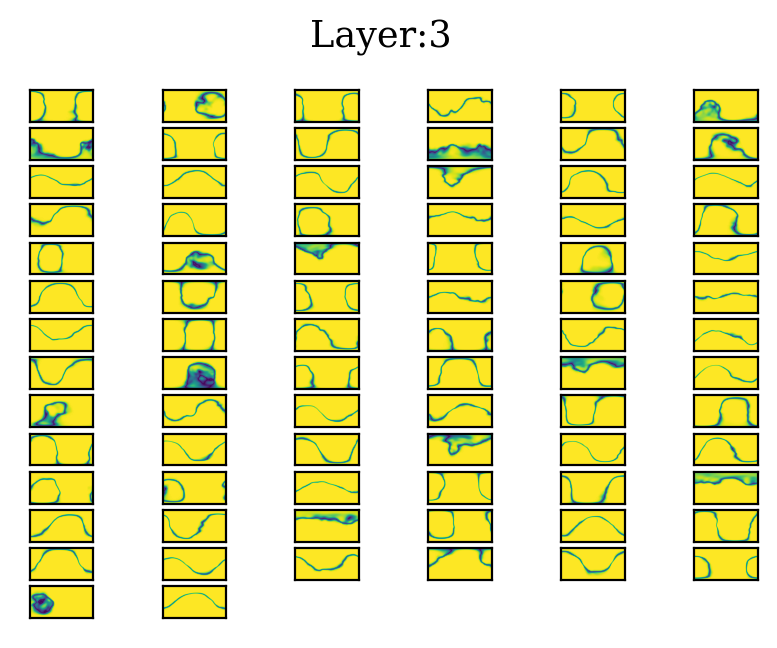

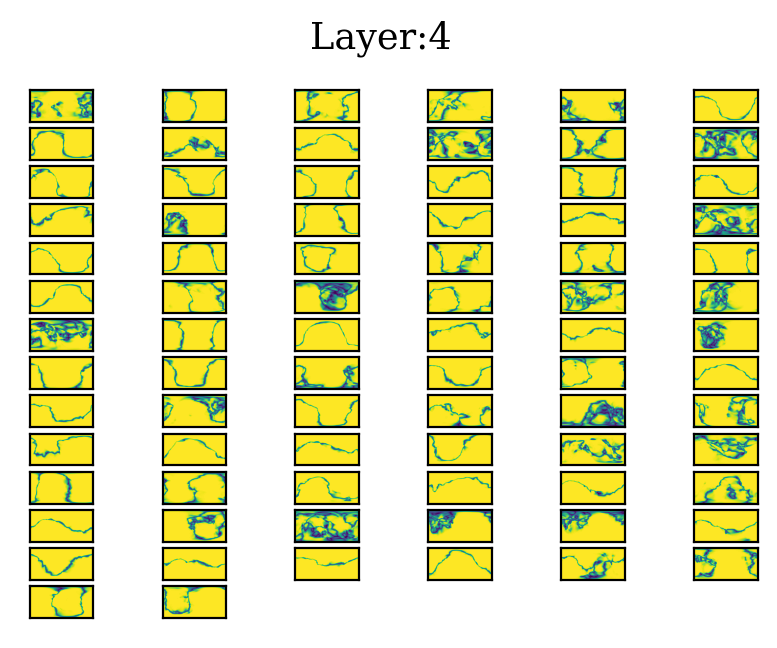

...

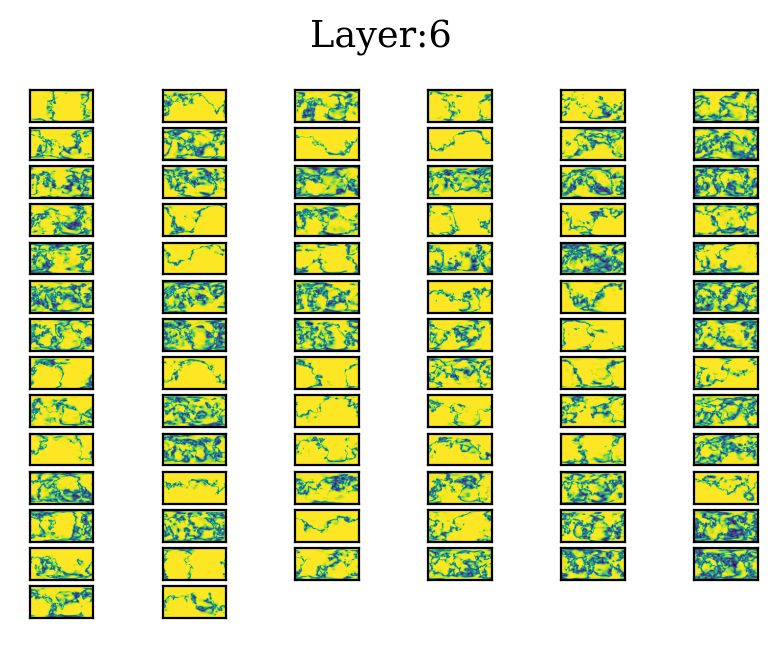

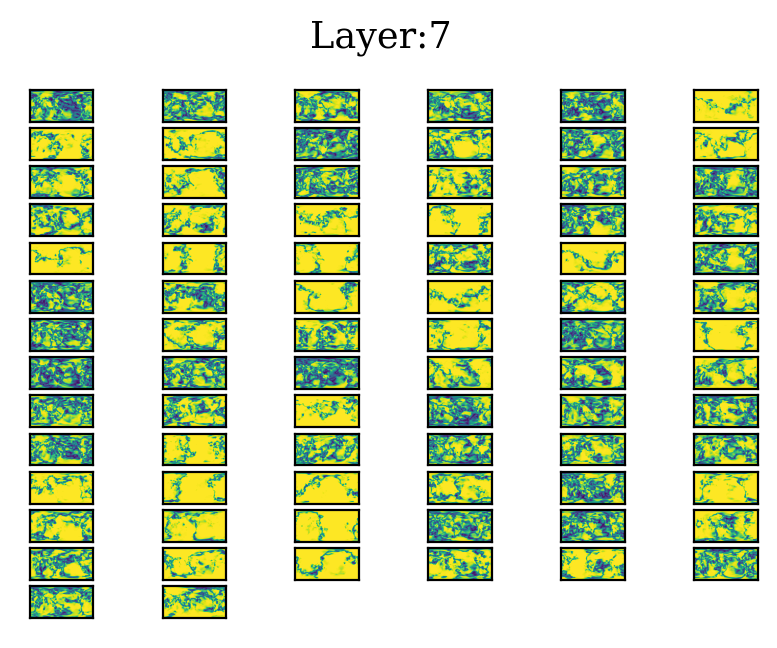

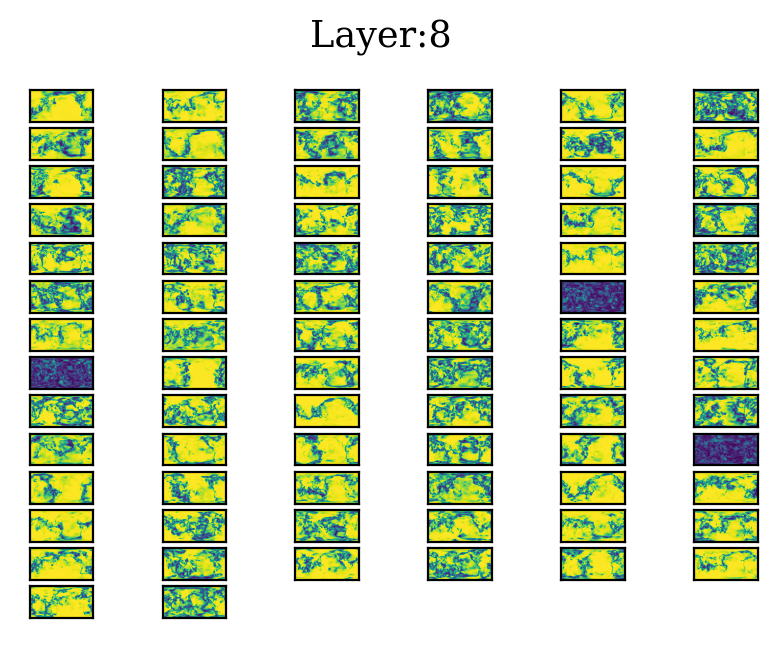

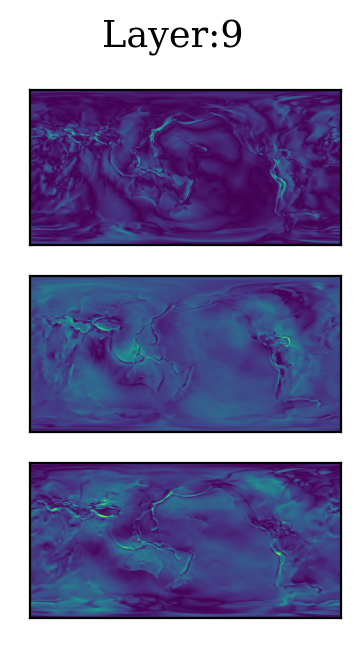

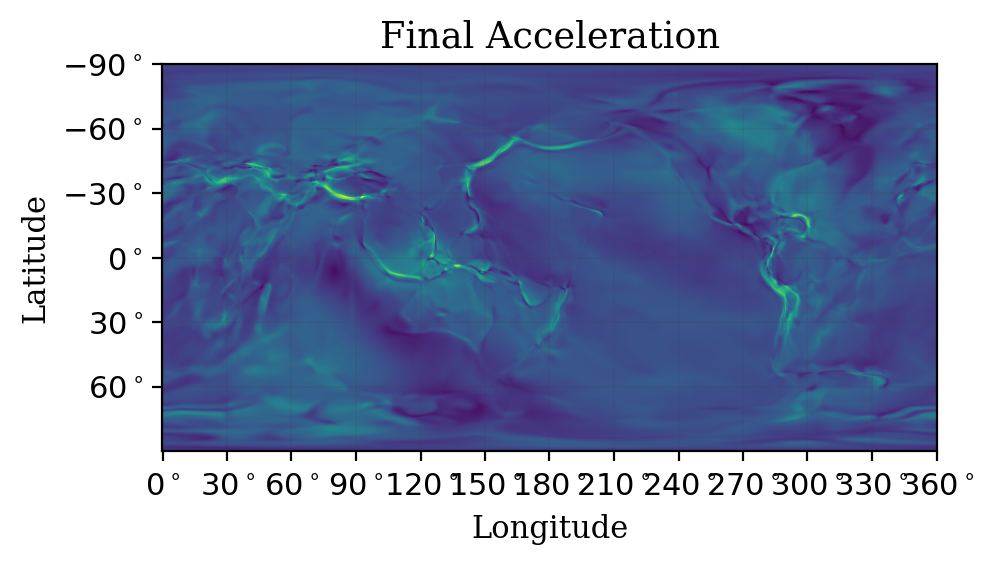

In [38]:
ids = df['id'].values
id_value, columns = ids[0], 6

model_id = id_value
config, model = load_config_and_model(model_id, df)
plot_intermediate_layer(config, model, columns)


# Worst Performer

In [46]:
df = df.sort_values(by='Brillouin_rse_mean', ascending=True)
df.iloc[-1]

Brillouin_max_error                                                        0.00617331
Brillouin_param_rse_mean                                                           -1
Brillouin_param_rse_median                                                         -1
Brillouin_param_sigma_2_c_mean                                                     -1
Brillouin_param_sigma_2_c_median                                                   -1
Brillouin_param_sigma_2_mean                                                       -1
Brillouin_param_sigma_2_median                                                     -1
Brillouin_param_sigma_3_c_mean                                                     -1
Brillouin_param_sigma_3_c_median                                                   -1
Brillouin_param_sigma_3_mean                                                       -1
Brillouin_param_sigma_3_median                                                     -1
Brillouin_rse_mean                                    

c:\users\john\documents\research\venv\tf2env\lib\site-packages\ipykernel_launcher.py:26: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


ValueError: num must be 1 <= num <= 3, not 4

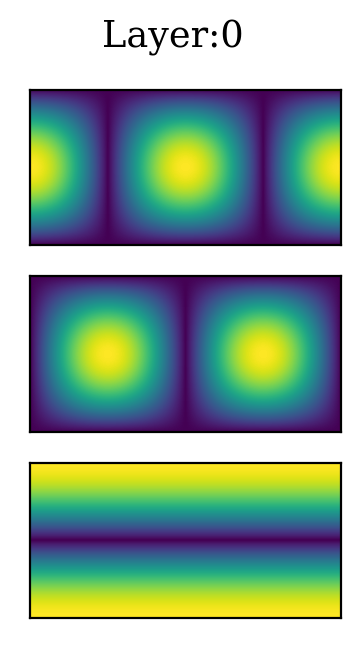

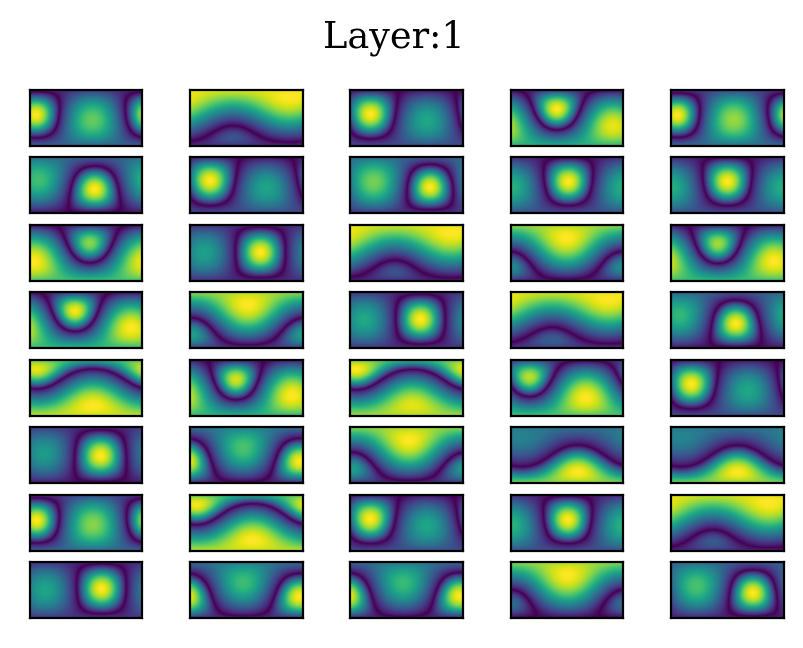

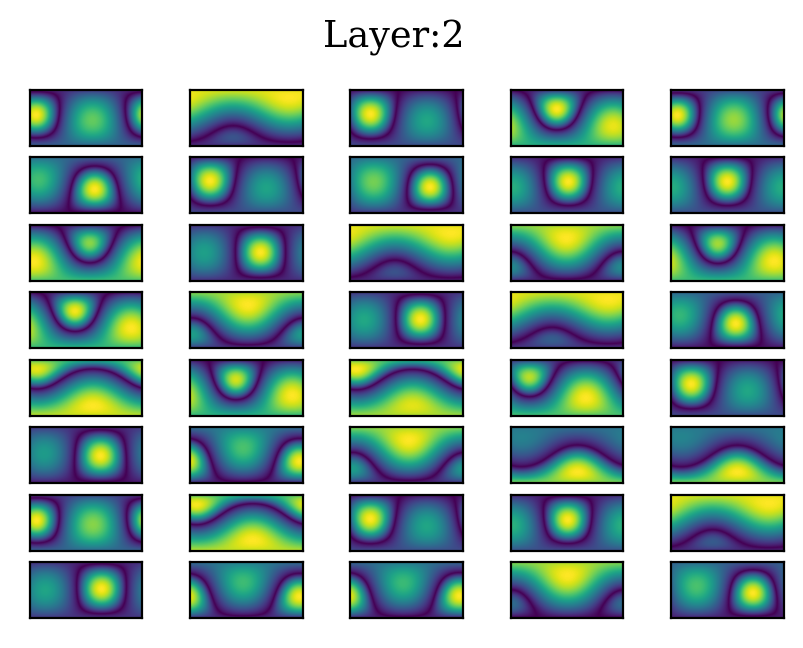

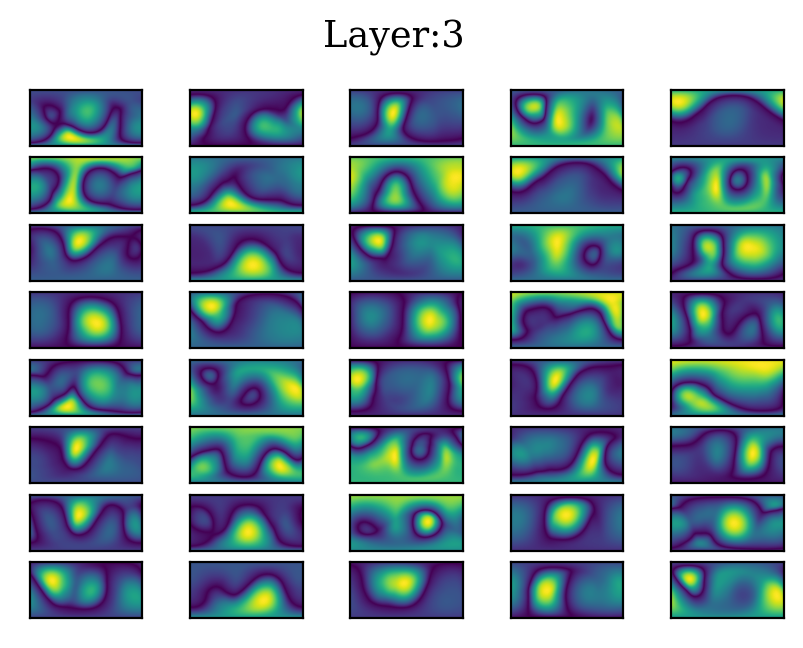

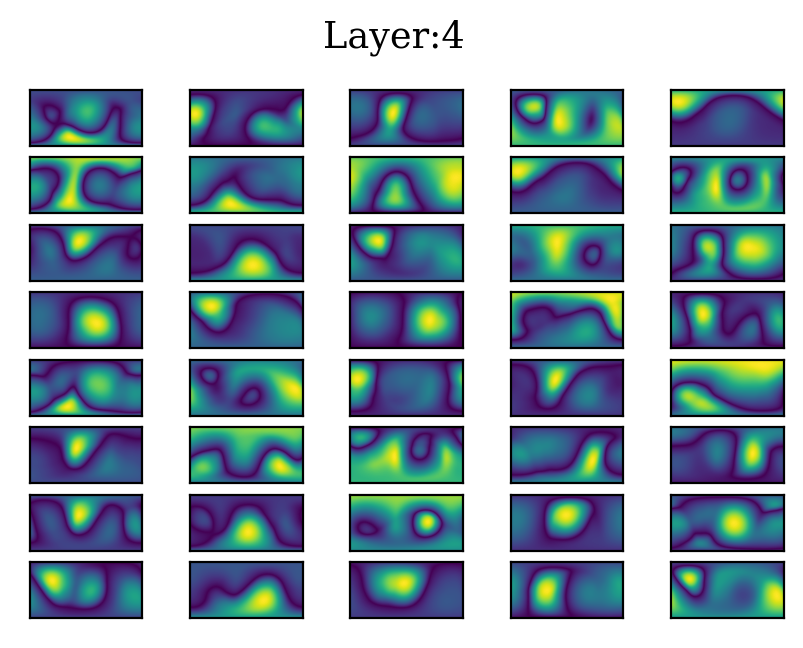

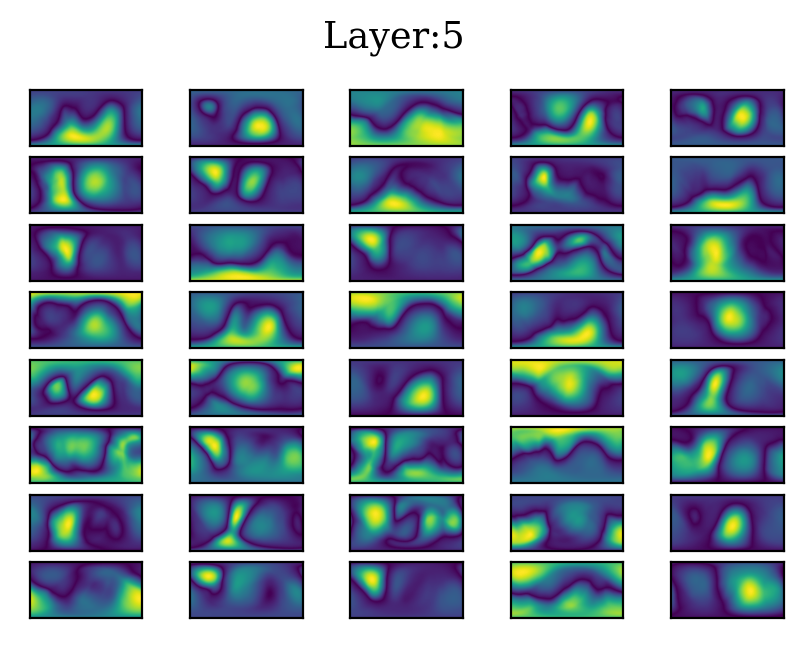

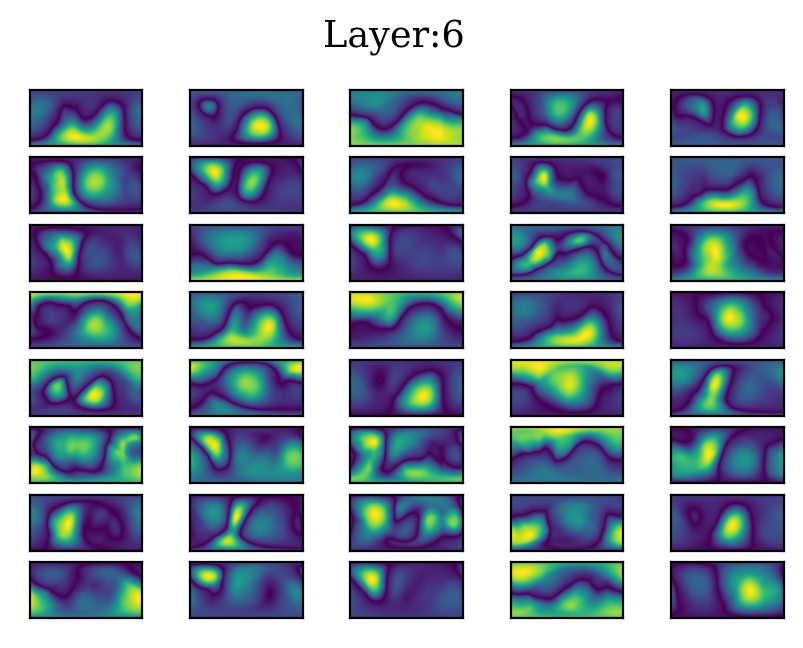

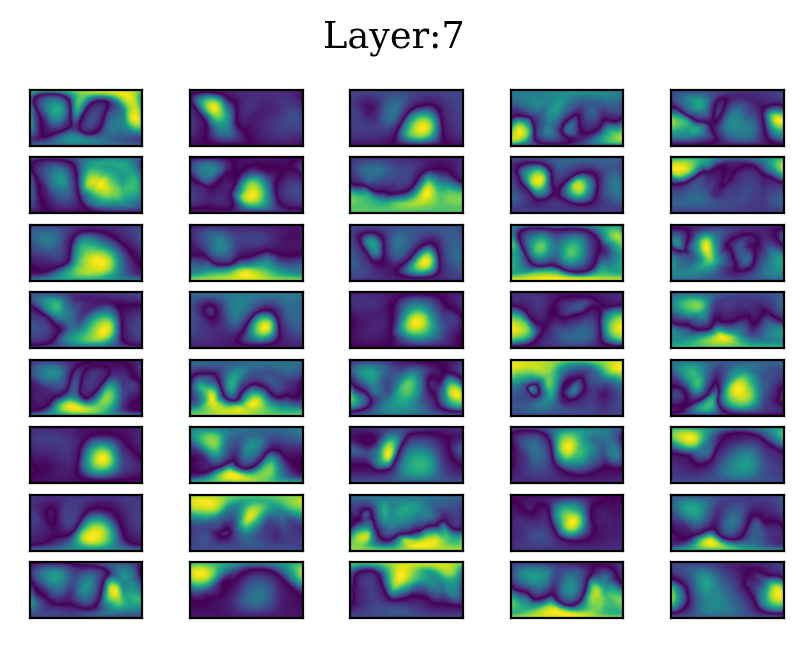

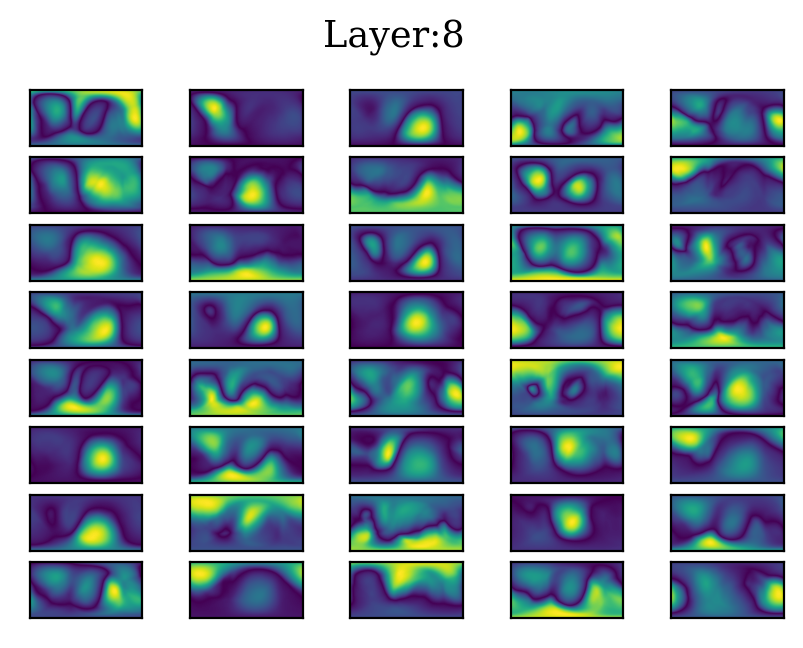

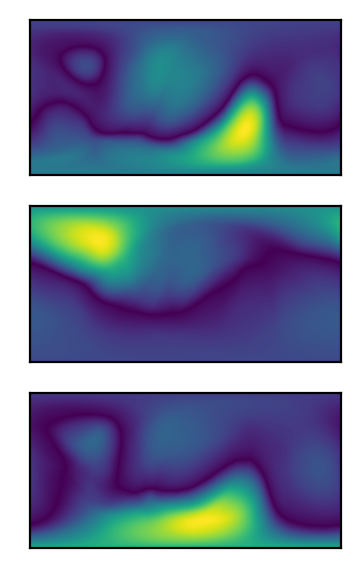

In [40]:
ids = df['id'].values
id_value, columns = ids[-1], 5

model_id = id_value
config, model = load_config_and_model(model_id, df)
plot_intermediate_layer(config, model, columns)

# Dropout Effect

In [ ]:
df = df.sort_values(by='dropout', ascending=False)
df[0]

c:\users\john\documents\research\venv\tf2env\lib\site-packages\ipykernel_launcher.py:26: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


ValueError: num must be 1 <= num <= 3, not 4

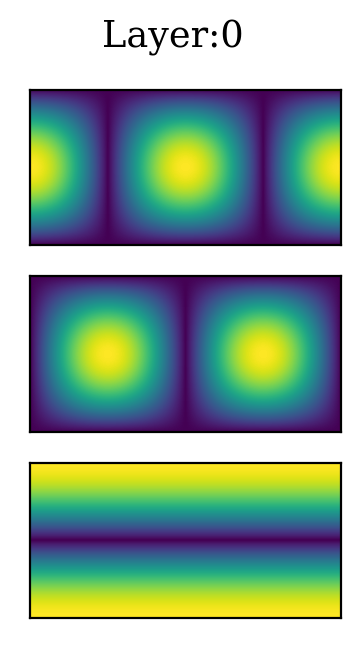

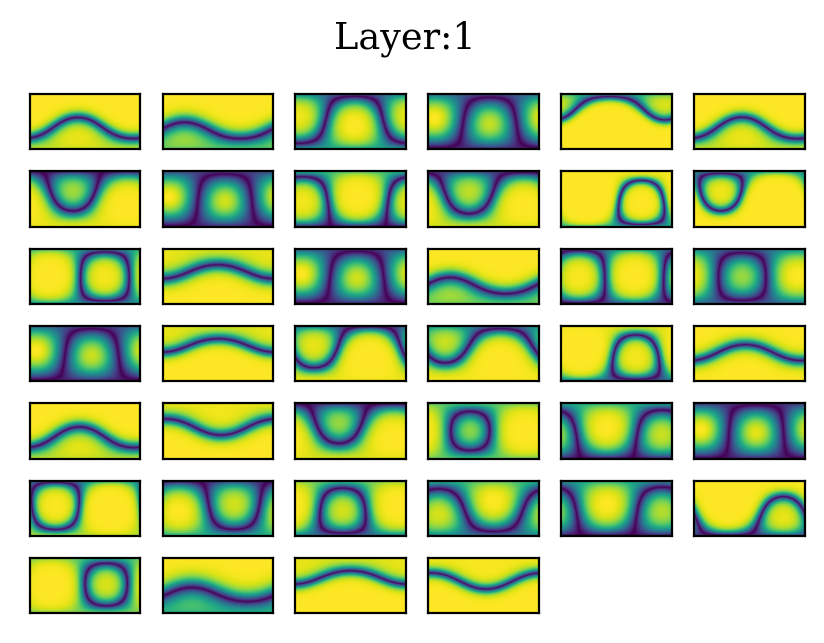

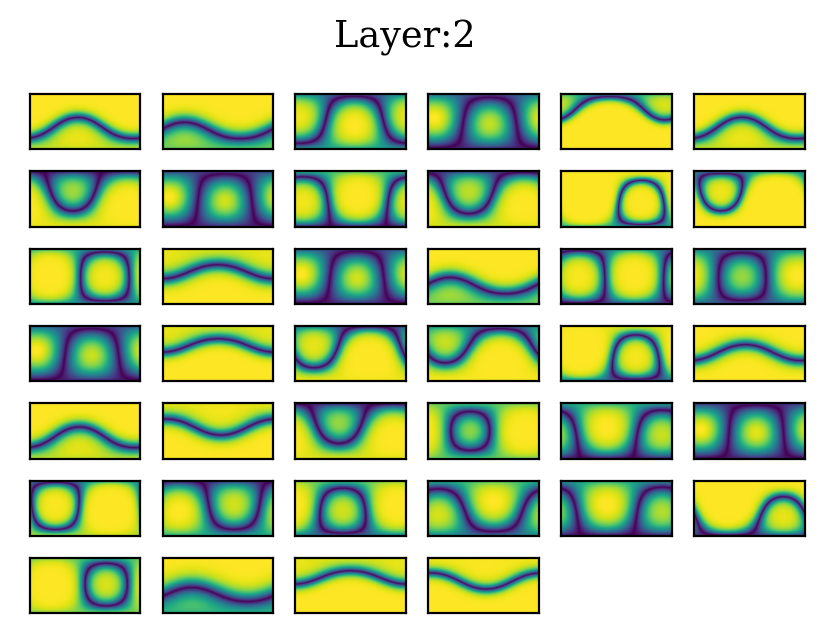

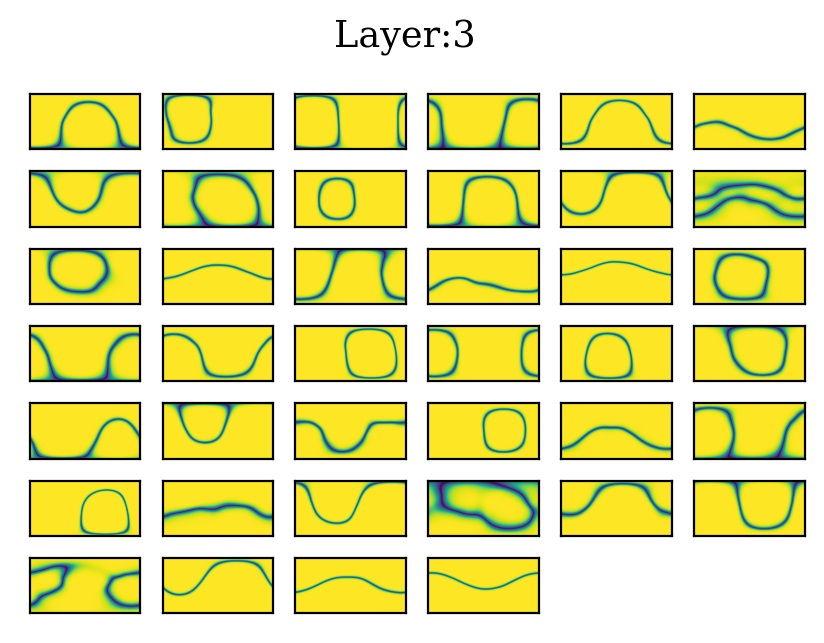

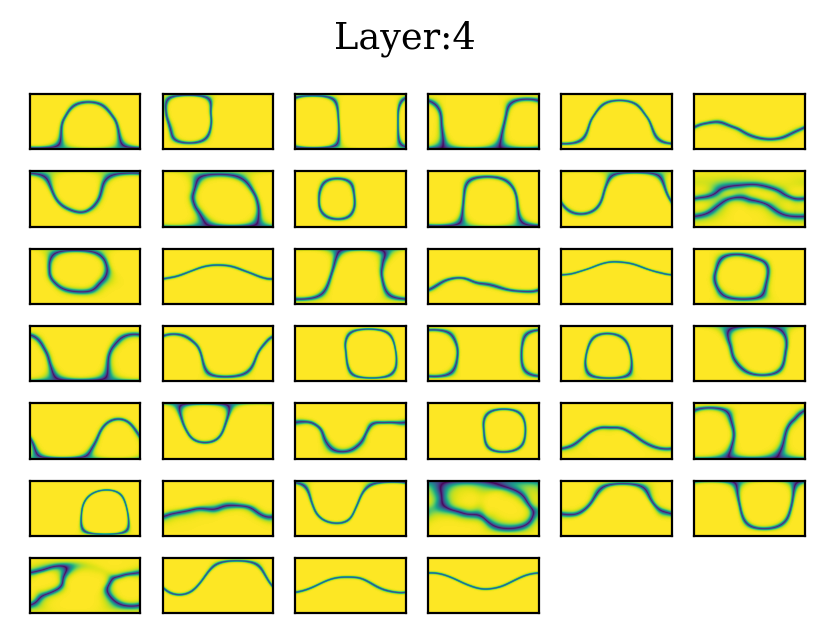

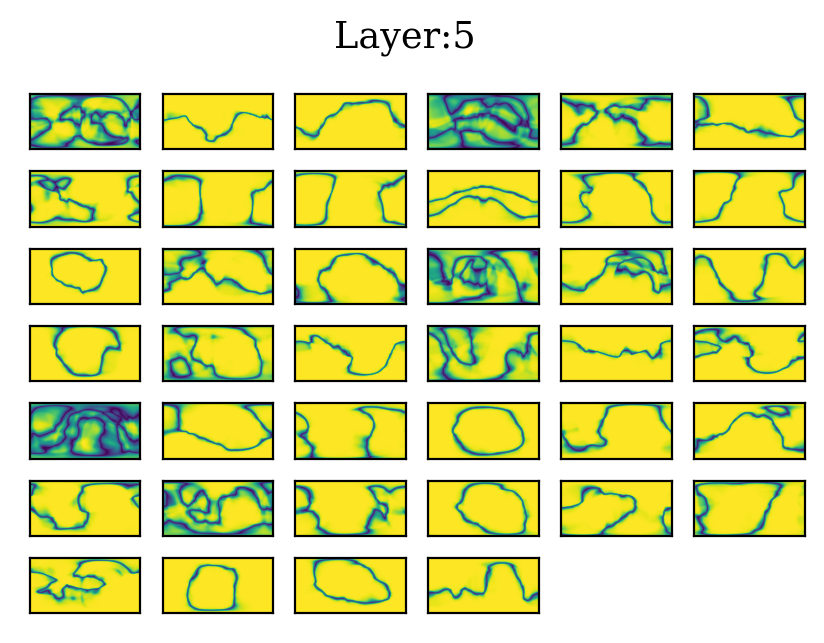

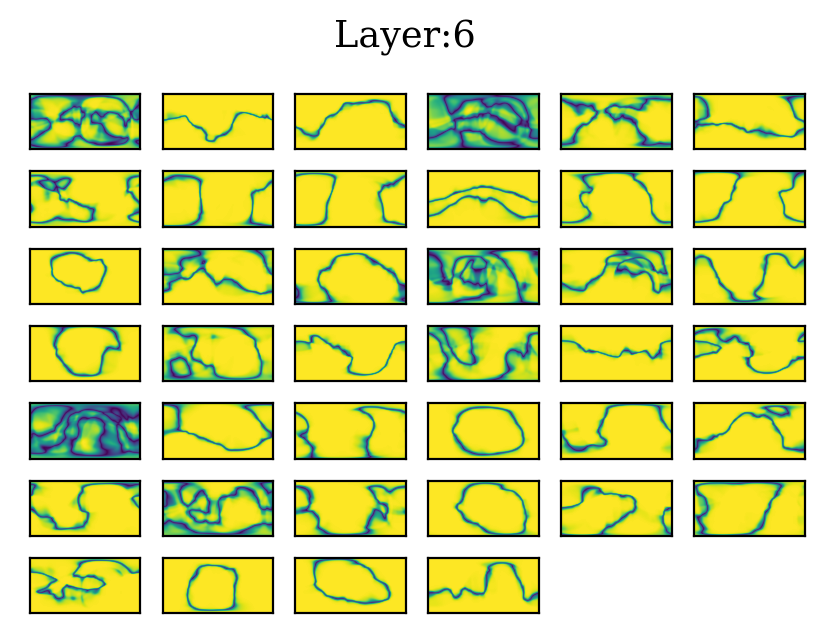

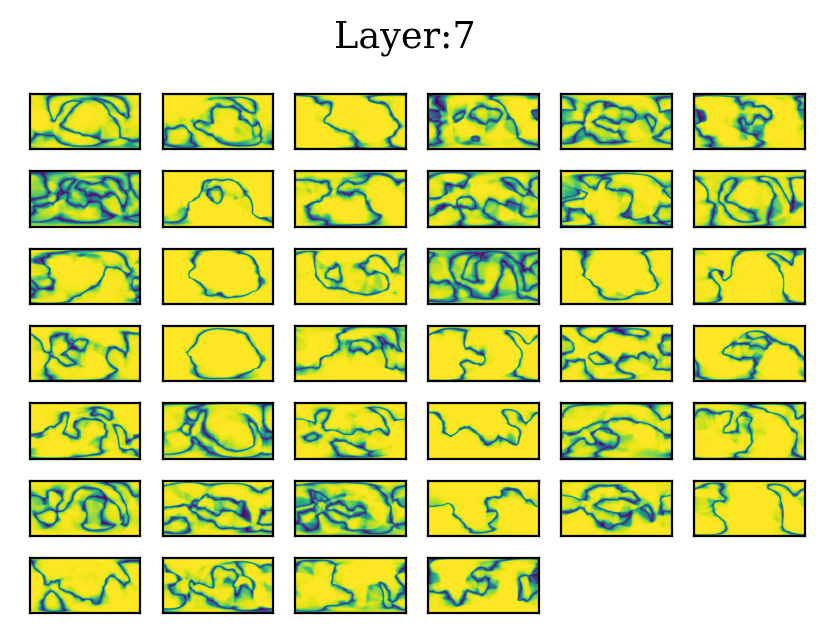

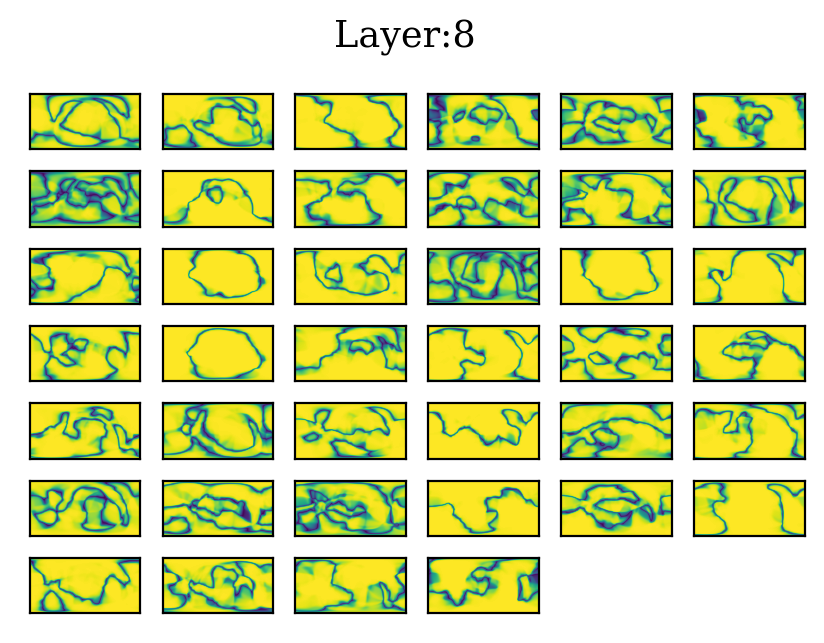

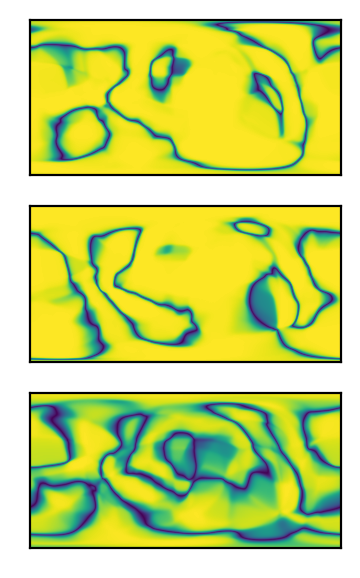

In [41]:
df = df.sort_values(by='dropout', ascending=False)
ids = df['id'].values
id_value, columns = ids[0], 6

model_id = id_value
config, model = load_config_and_model(model_id, df)
plot_intermediate_layer(config, model, columns)